# Visualizations

In [2]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold, KFold

from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, multilabel_confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve, classification_report
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import auc
from itertools import combinations
import seaborn as sns

import time
import datetime
import seaborn as sns
import matplotlib.pyplot as plt


from helpers import load_sqlite, custom_stop_words
from visualizer import Visualizer
%matplotlib inline

%load_ext autoreload
%autoreload 2

In [3]:
# ==================== CONSTANTS ==================== #
seed = 77
np.random.seed(seed)


In [4]:
labels = ['python','aws','datascience','machinelearning','dataengineering']

df = load_sqlite(database='reddit.sqlite', class_labels=labels)

print(len(df))
df.sample(10)

12793


,title,subreddit,date
91007,[R] Cooperation Instead of Competition: Harvar...,machinelearning,2020-05-12
117876,Handling of persistent tokens for a cli app,aws,2020-05-16
478,Windows powershell command to look up tags,aws,2020-03-29
4723,Why Not Airflow?,dataengineering,2020-03-29
2351,[R] Conceptual Game Expansion,machinelearning,2020-03-29
12470,I made a library to automatically discover &am...,python,2020-04-10
63739,[D] Cluster unlabelled paired data,machinelearning,2020-04-30
33494,Issues with Workspaces,aws,2020-04-23
12453,Is it practically possible to build a .py file...,python,2020-04-10
7691,Can you have buttons in created through tkinte...,python,2020-04-02


In [5]:
X = df['title']
y = df['subreddit']

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [7]:
type(X_train)

pandas.core.series.Series

In [8]:
tfidf = TfidfVectorizer(max_df=0.7, max_features=6000, ngram_range=(1,2), stop_words=custom_stop_words)

In [9]:
X_train_transformed = tfidf.fit_transform(X_train)
X_test_transformed = tfidf.transform(X_test)

In [10]:
type(X_train_transformed)

scipy.sparse.csr.csr_matrix

In [11]:
type(X_train_transformed.toarray())

numpy.ndarray

In [12]:
model = LogisticRegression()
model.fit(X_train_transformed, y_train) # fit model for use in visualizer

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
scores = cross_val_score(model, X_train_transformed, y_train, cv=skf)
print(scores)
print(np.mean(scores))

[0.70974466 0.72120896 0.69828035 0.7029703  0.6991658 ]
0.7062740141529658


In [13]:
y_pred = model.predict(X_test_transformed)
y_probs = model.predict_proba(X_test_transformed)

print('ROC AUC SCORE: ', roc_auc_score(y_test, y_probs, multi_class='ovr'))
print()
print(classification_report(y_test, y_pred, digits=3, target_names=np.unique(y)))

ROC AUC SCORE:  0.8999941025099745

                 precision    recall  f1-score   support

            aws      0.810     0.801     0.805       757
dataengineering      0.624     0.366     0.462       322
    datascience      0.614     0.205     0.308       341
machinelearning      0.761     0.709     0.734       580
         python      0.659     0.884     0.755      1199

       accuracy                          0.708      3199
      macro avg      0.694     0.593     0.613      3199
   weighted avg      0.705     0.708     0.686      3199



In [14]:
# Using X_train instead of X in order to visualize data trained on.
# X may also be used, but will visualize the entire dataset
# X or y cannot be transformed
viz = Visualizer(X=X_train, y=y_train, transformer=tfidf, classifier=model)

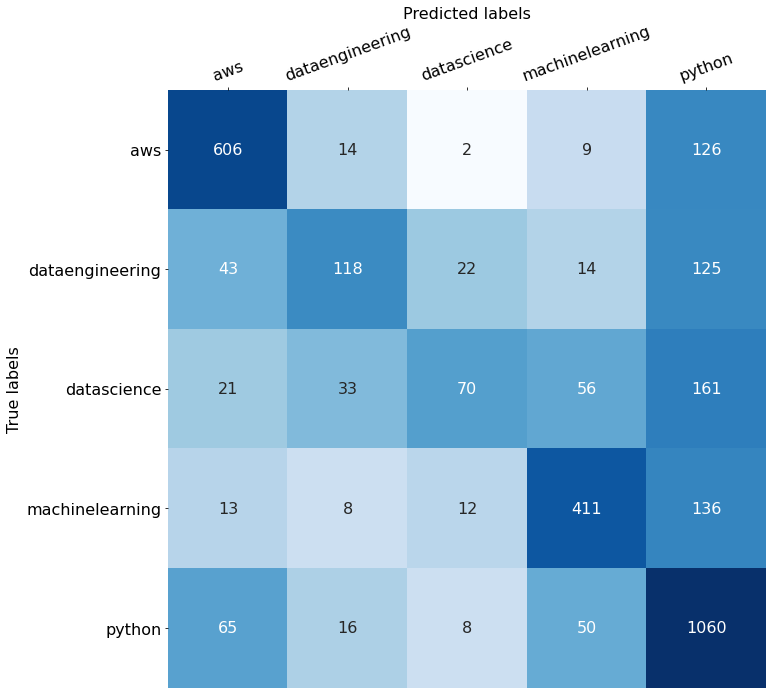

In [15]:
viz.plot_confusion_matrix(y_true=y_test, y_pred=y_pred)

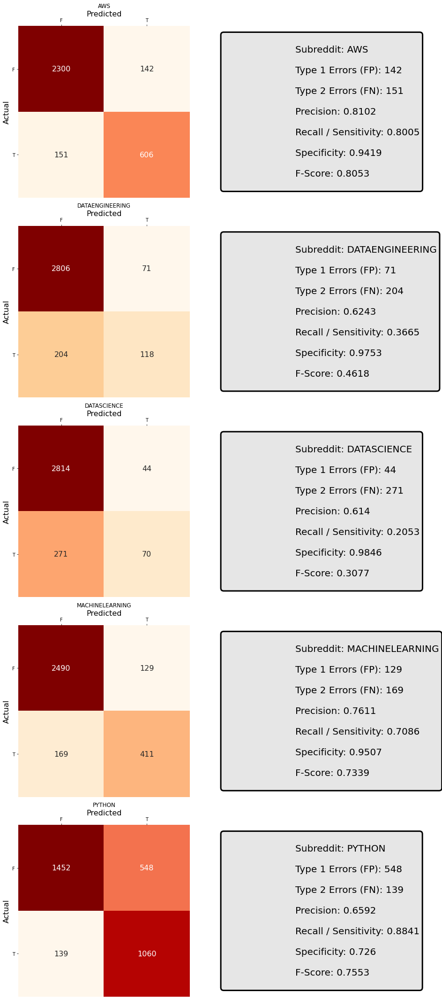

In [16]:
viz.plot_confusion_matrices(y_true=y_test, y_pred=y_pred, colormap='OrRd')

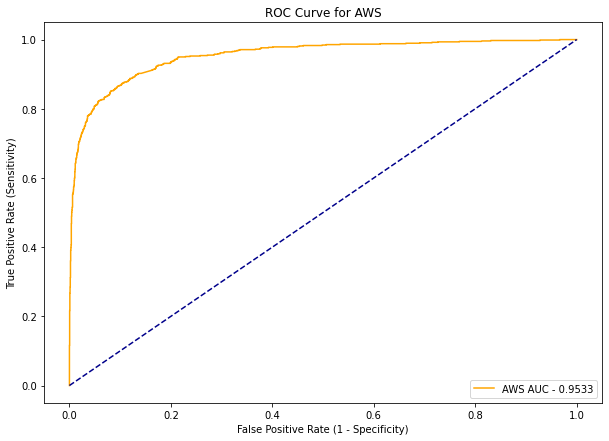

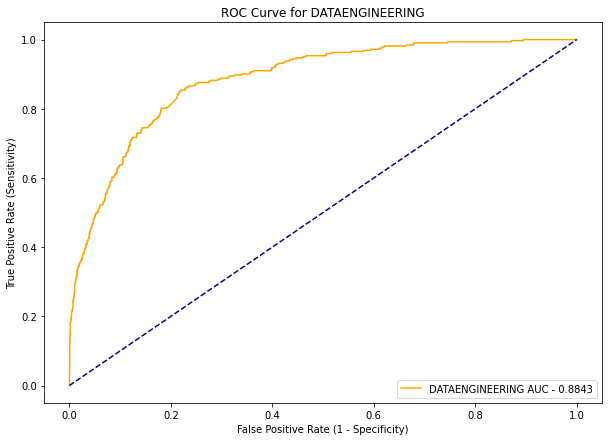

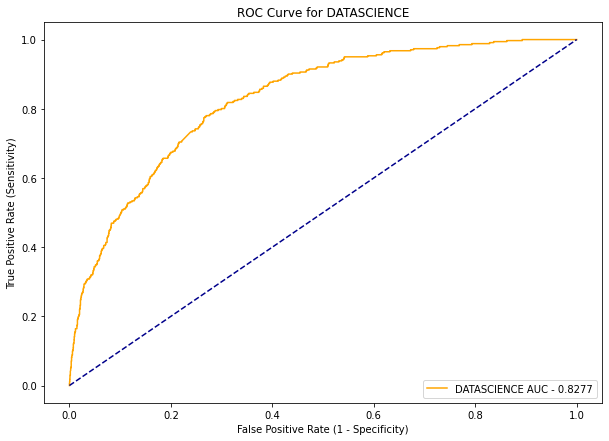

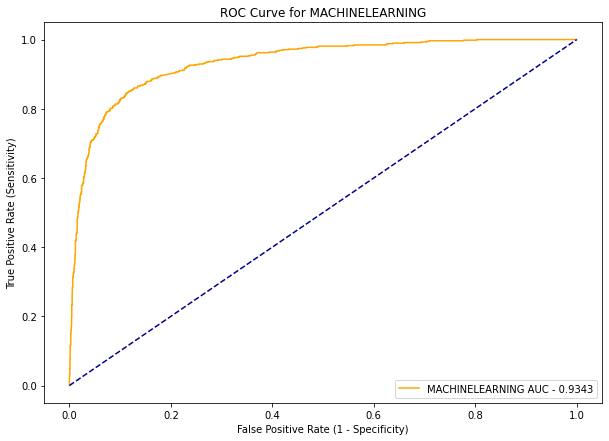

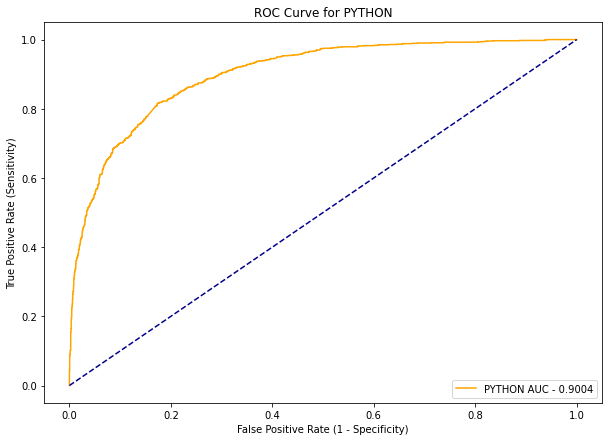

In [17]:
viz.plot_class_roc_curves(y_true=y_test, y_probs=y_probs)

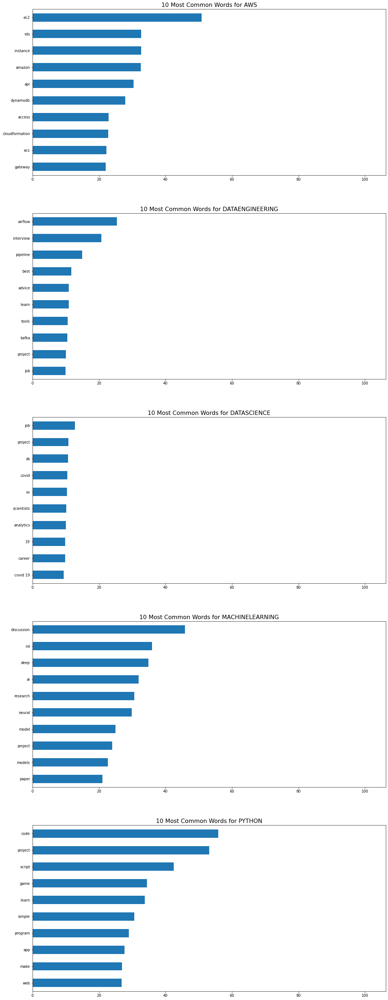

In [18]:
viz.plot_most_common(num_features=10, include_combined=False, standardize=True)

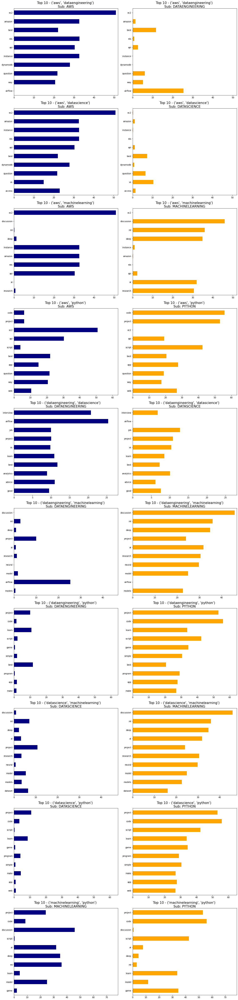

In [19]:
viz.plot_most_common_pairs(num_features=10)

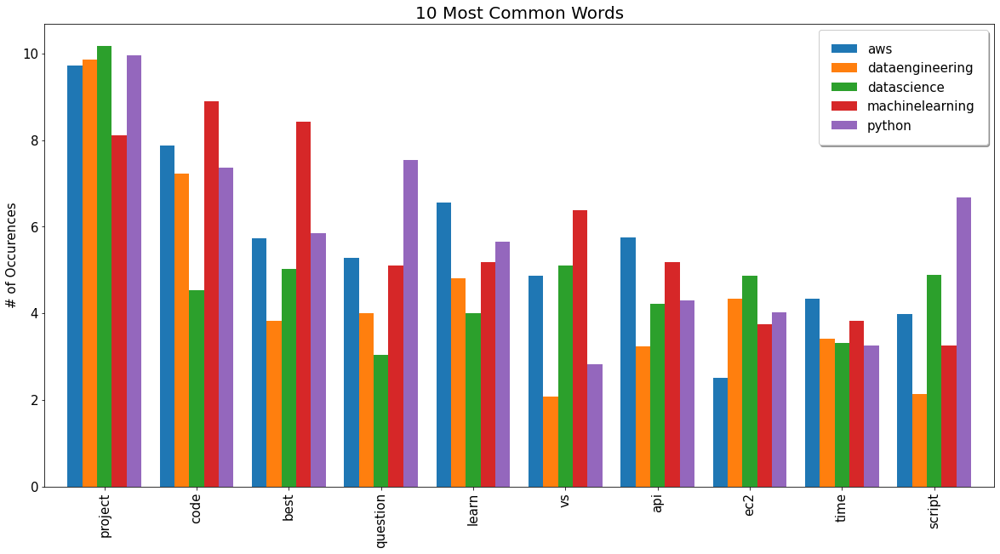

In [20]:
viz.plot_most_common_bar(num_features=10)


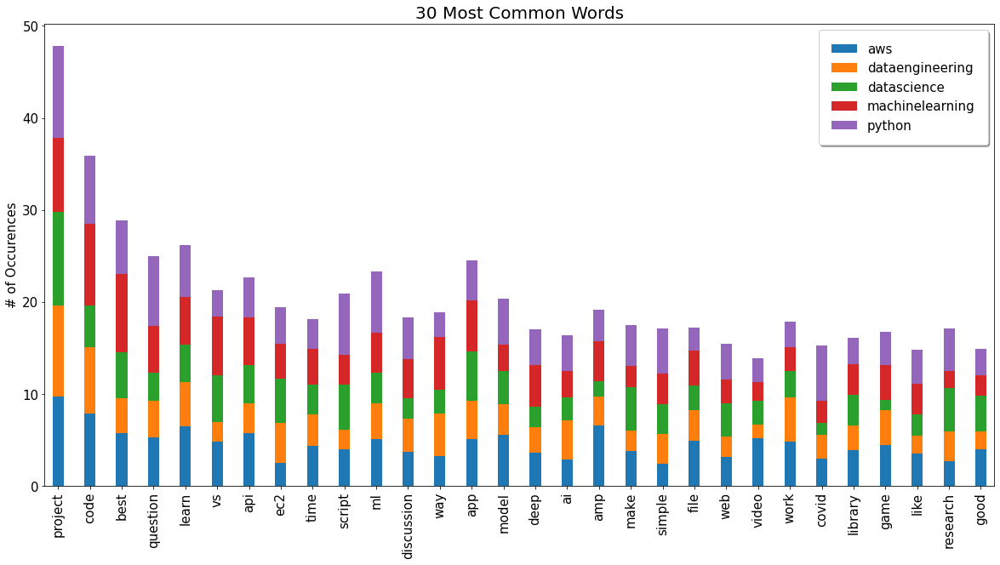

In [21]:
viz.plot_most_common_bar(num_features=30, stacked=True)


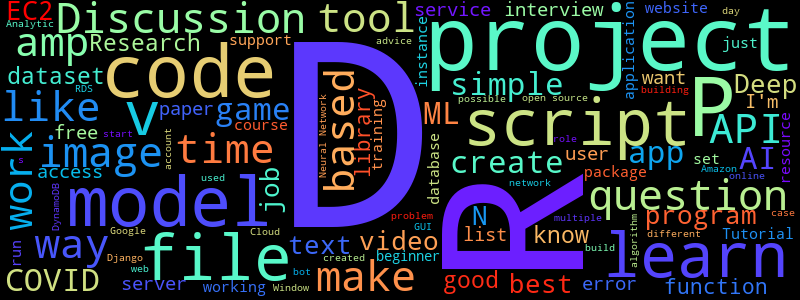

In [22]:
viz.make_cloud(stopwords=custom_stop_words, colormap='rainbow')


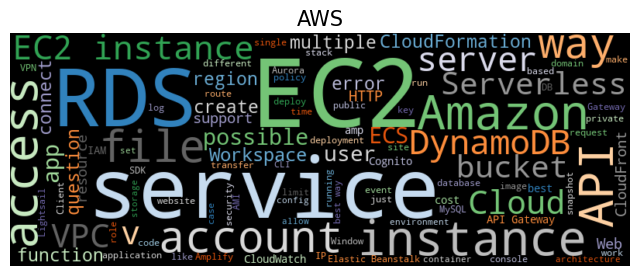

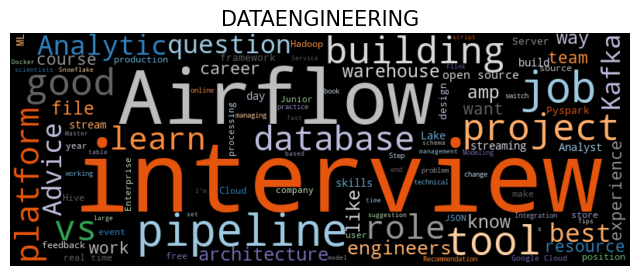

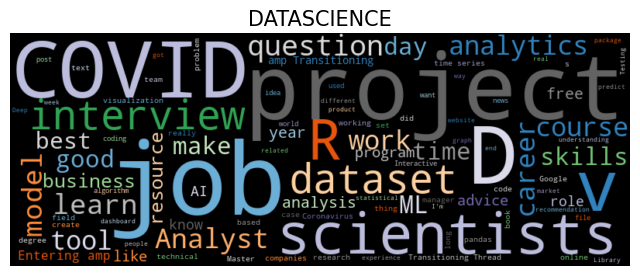

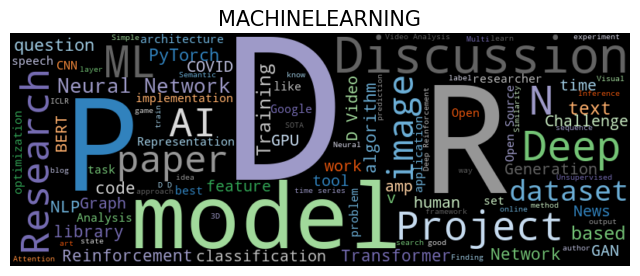

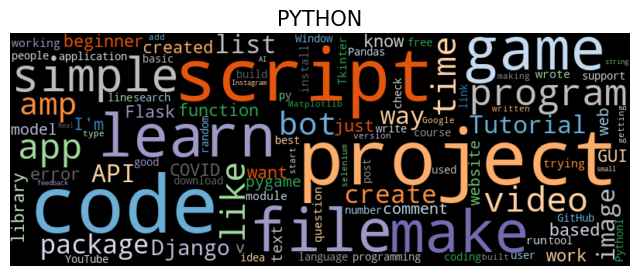

In [23]:
viz.make_cloud(split=True, stopwords=custom_stop_words, colormap='random', background_color='black')


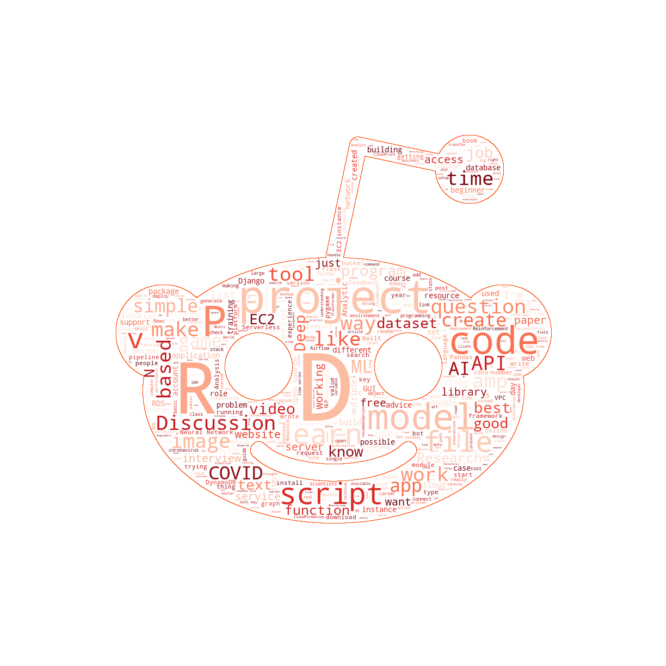

In [24]:
viz.cloud_image_mask(image='images/reddit03.png', stopwords=custom_stop_words)


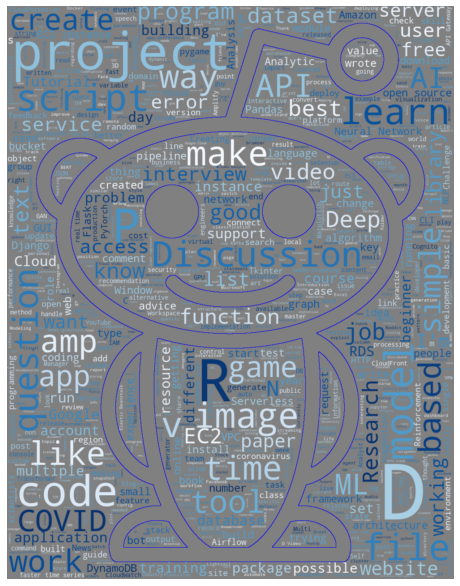

In [25]:
viz.cloud_image_mask(image='images/reddit02.jpg', figsize=(8,12), max_words=1000, colormap='Blues', outline_color='blue', stopwords=custom_stop_words, background_color='gray', reverse=False)

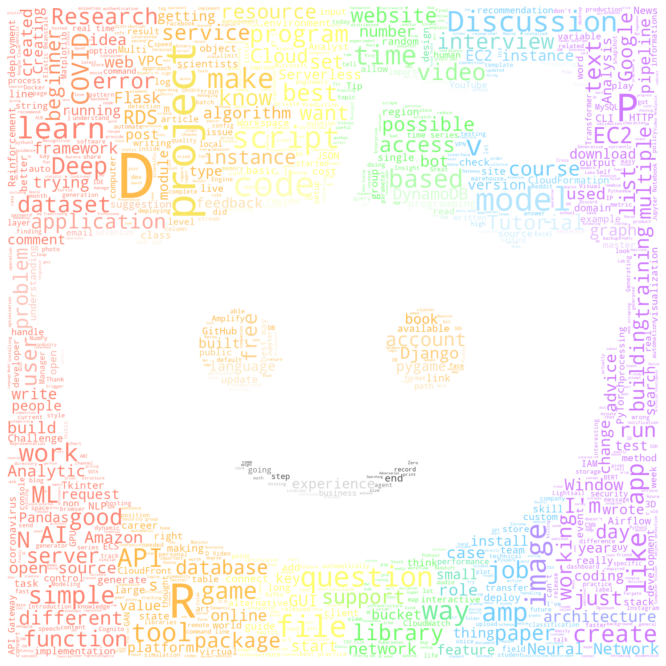

In [26]:
viz.cloud_colored_image_mask(image="images/reddit06.jpg", figsize=(12,12), stopwords=custom_stop_words)


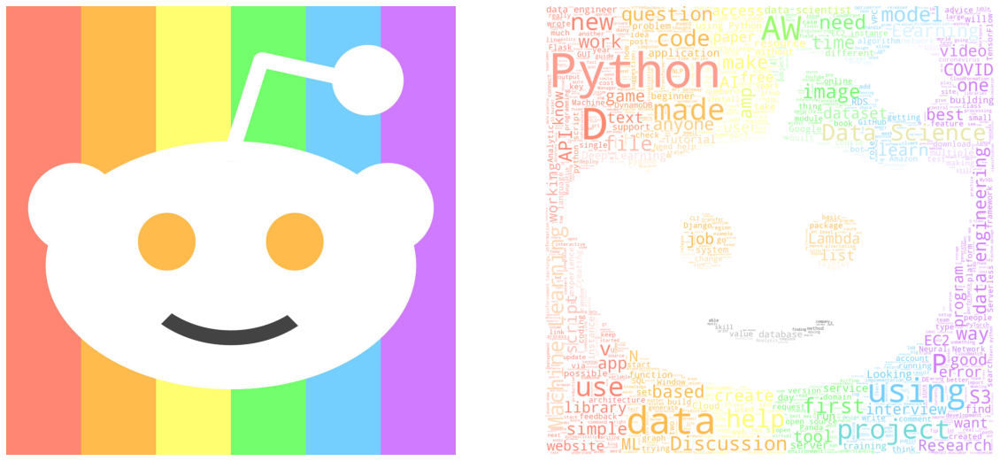

In [27]:
viz.cloud_colored_image_mask(image="images/reddit06.jpg", figsize=(20,10), max_words=1000, stopwords=None, include_original=True)

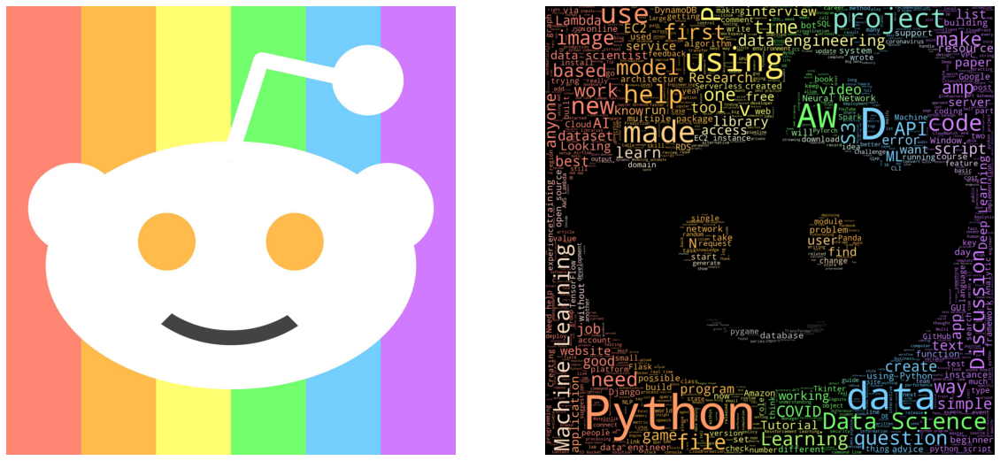

In [28]:
viz.cloud_colored_image_mask(image="images/reddit06.jpg", figsize=(20,10), max_words=1000, stopwords=None, background_color='black', include_original=True)

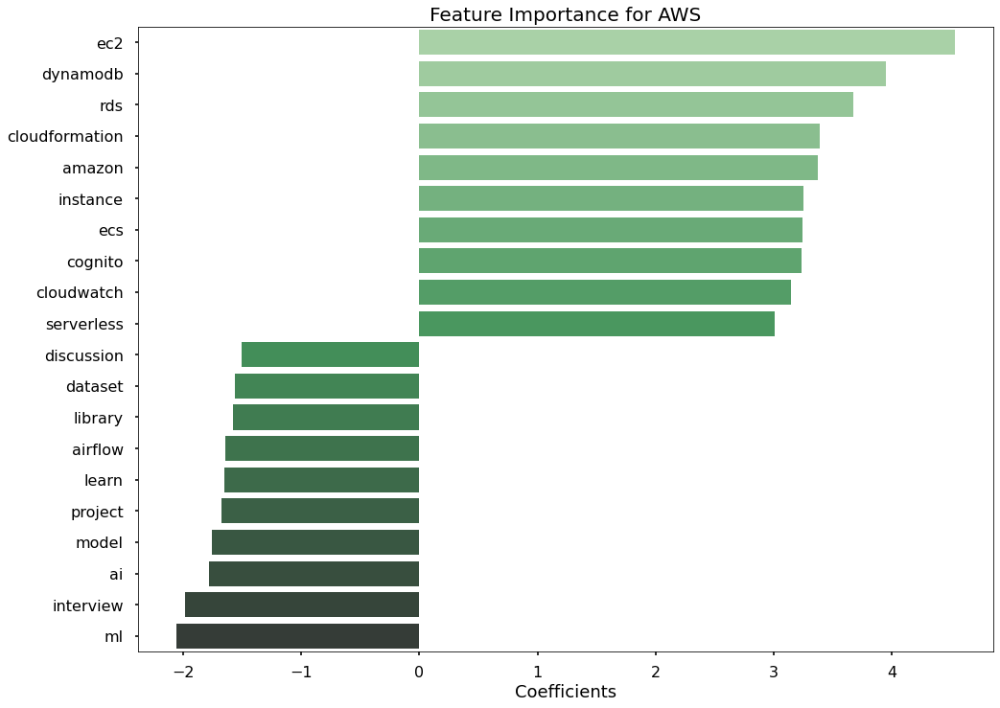

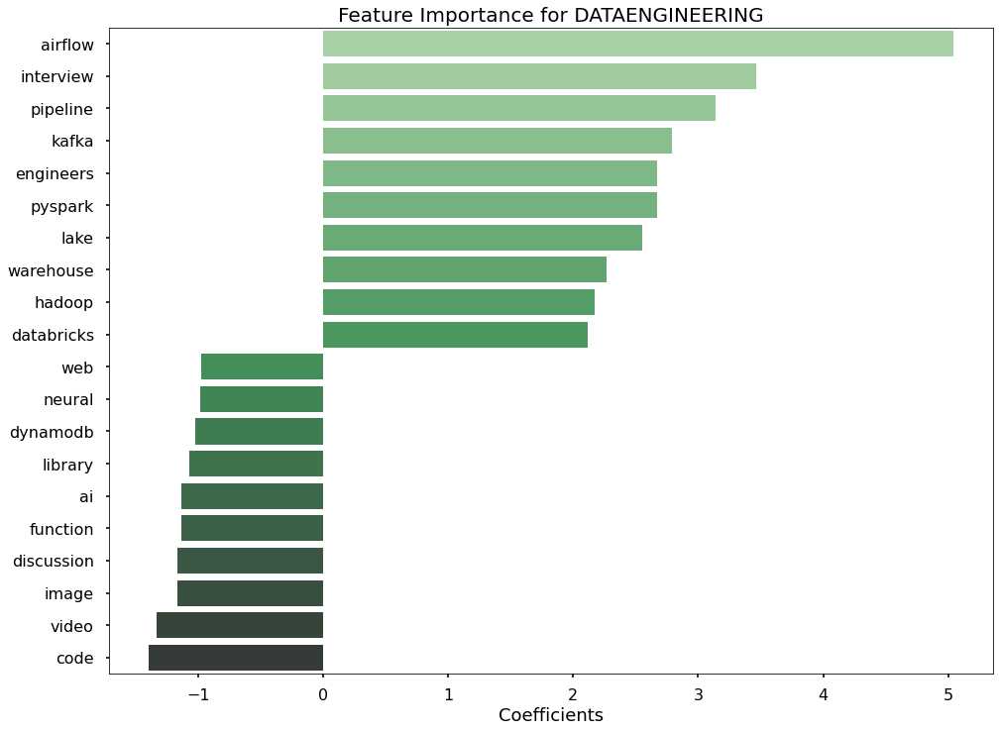

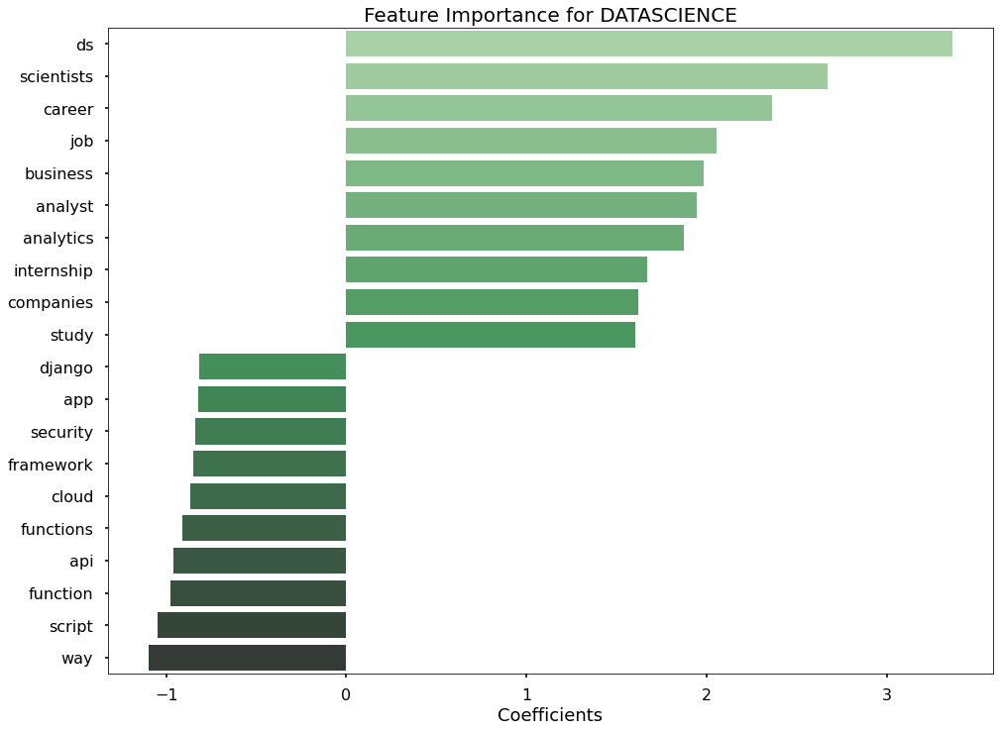

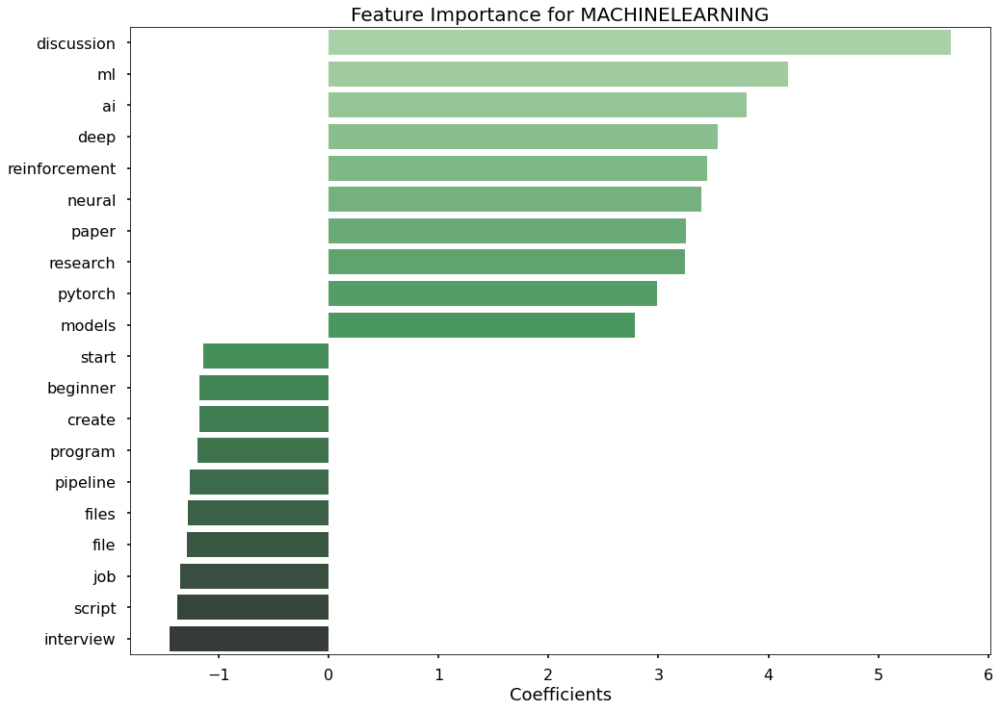

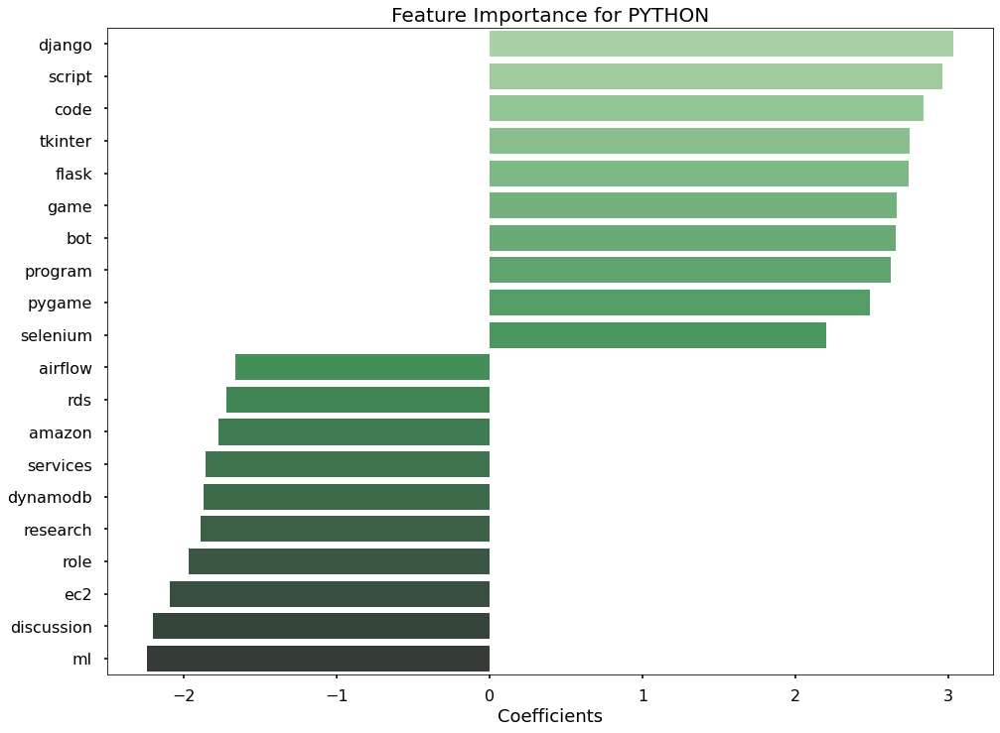

In [29]:
viz.plot_feature_importance(model=model, colormap='Greens_d')

In [30]:
probs_df = viz.display_probabilities_df(y_pred=y_pred, y_probs=y_probs)
probs_df

,aws,dataengineering,datascience,machinelearning,python,predicted,actual
0,0.056772,0.061062,0.063042,0.730987,0.088137,machinelearning,NaN
1,0.195203,0.059967,0.028542,0.033997,0.682290,python,aws
2,0.229796,0.079290,0.054313,0.081181,0.555420,python,NaN
3,0.015157,0.012303,0.014252,0.021870,0.936418,python,aws
4,0.079298,0.037747,0.275953,0.119877,0.487124,python,aws
...,...,...,...,...,...,...,...
3194,0.866719,0.032369,0.023857,0.034778,0.042277,aws,python
3195,0.194040,0.047011,0.045048,0.049104,0.664797,python,python
3196,0.228979,0.135155,0.184341,0.109201,0.342323,python,NaN
3197,0.149827,0.299427,0.081541,0.207244,0.261962,dataengineering,python


# Histograms

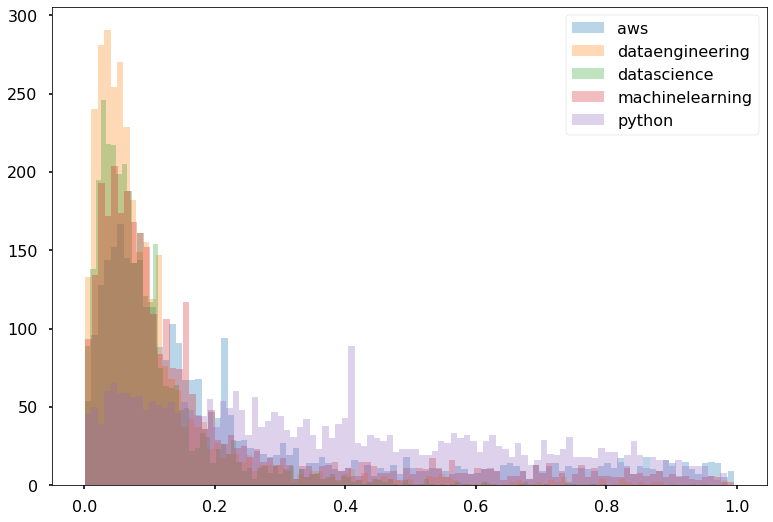

In [31]:
viz.plot_probability_distribution_overlaid(y_probs=y_probs)

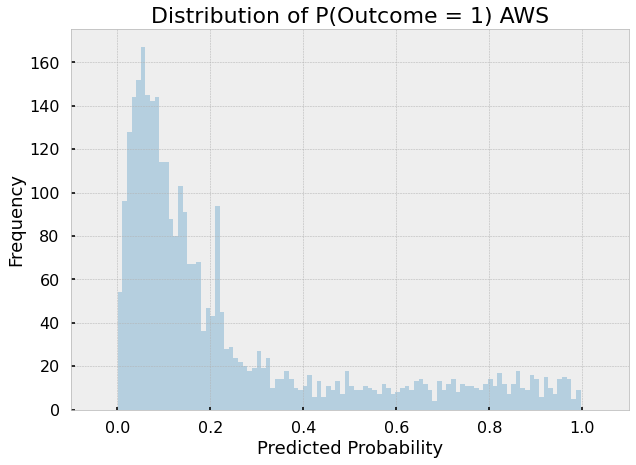

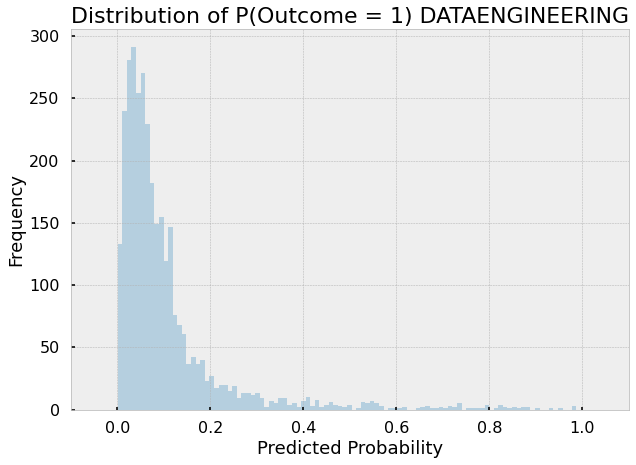

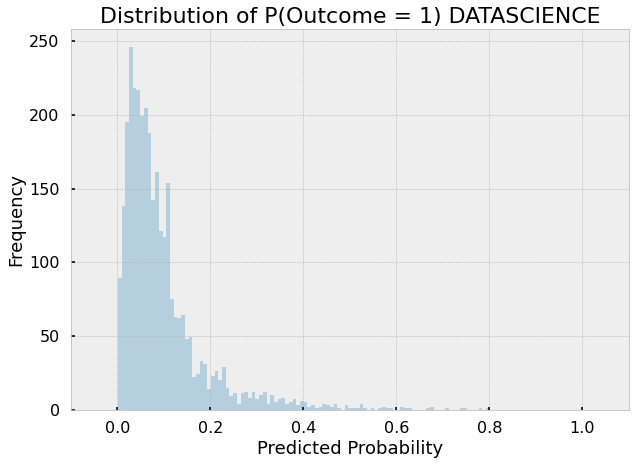

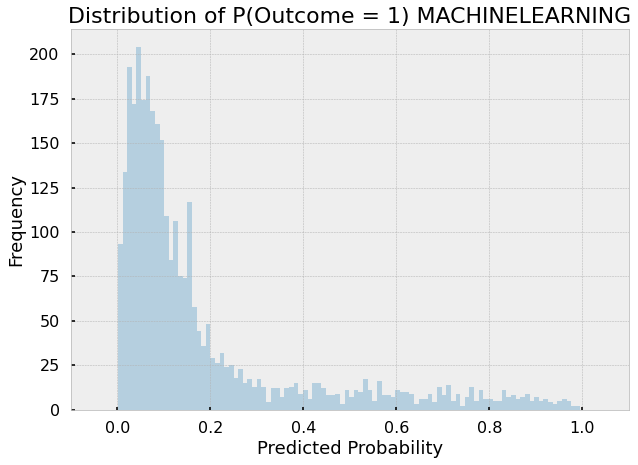

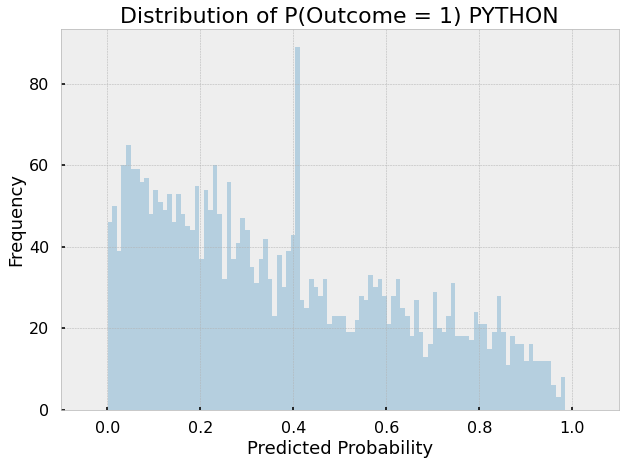

In [32]:
viz.plot_class_probability_distribution(y_probs=y_probs)

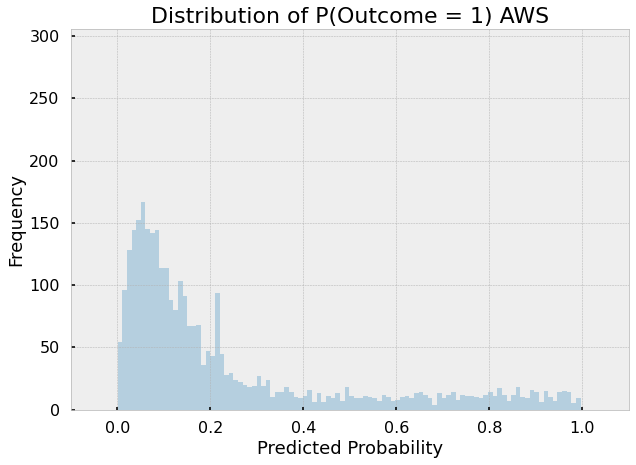

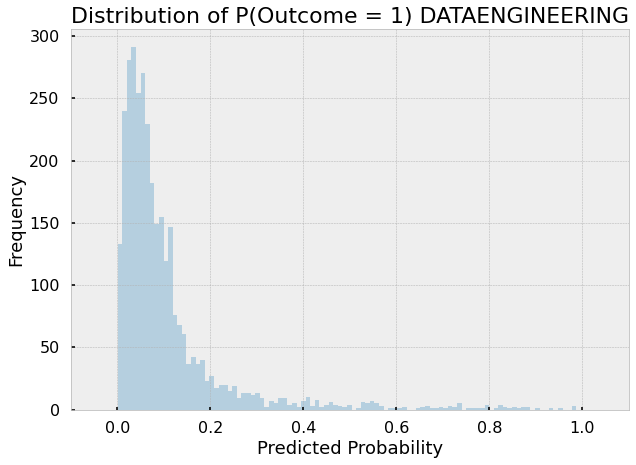

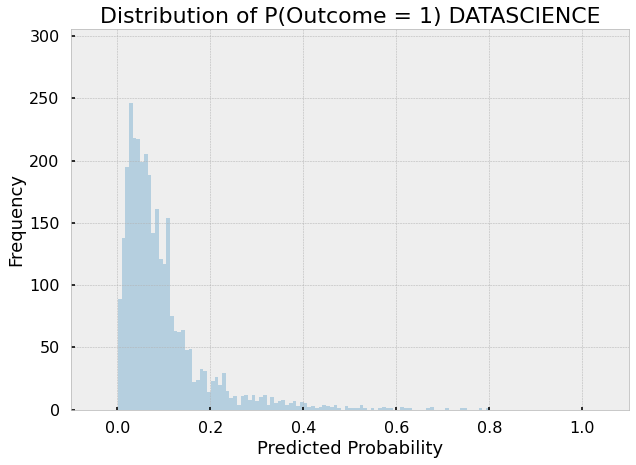

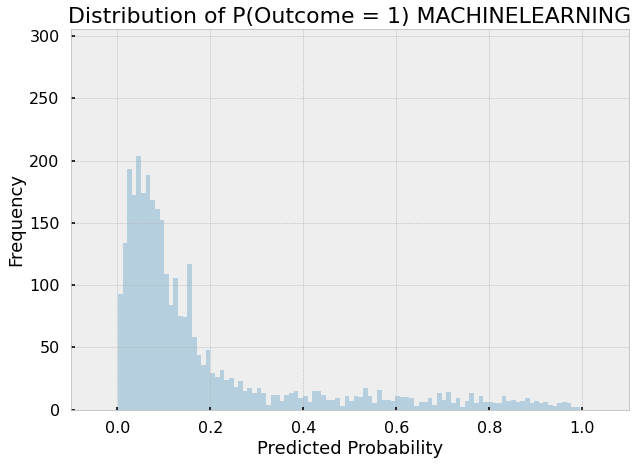

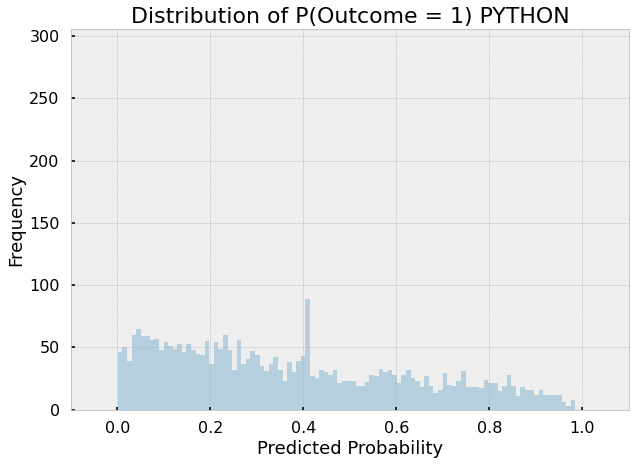

In [34]:
viz.plot_class_probability_distribution(y_probs=y_probs, match_scale=True)

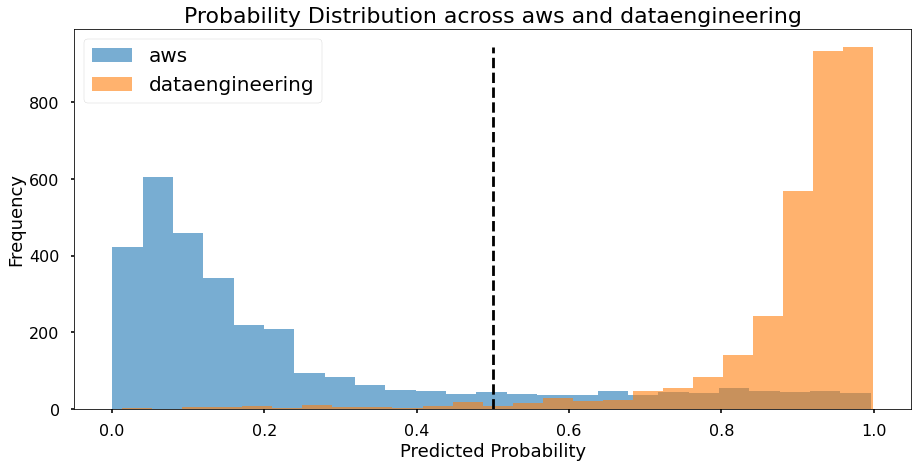

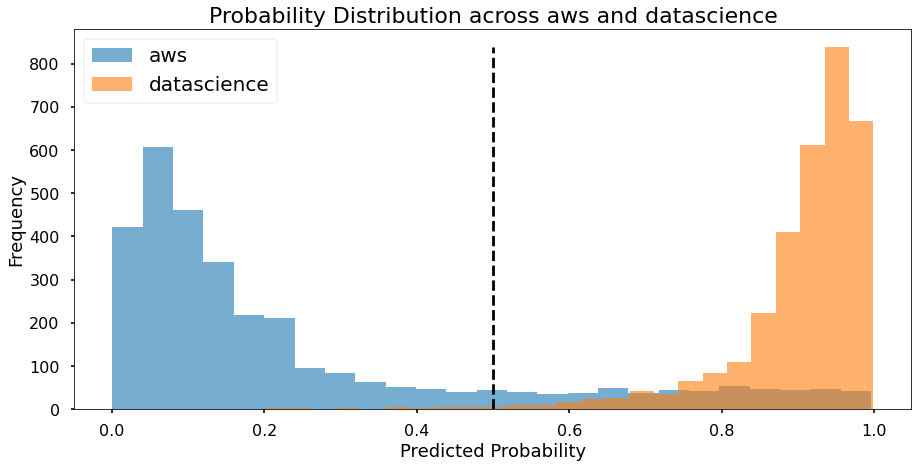

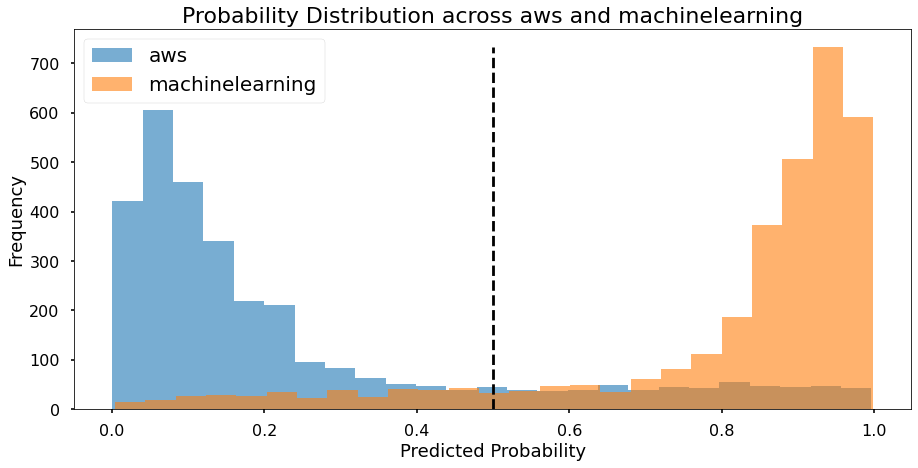

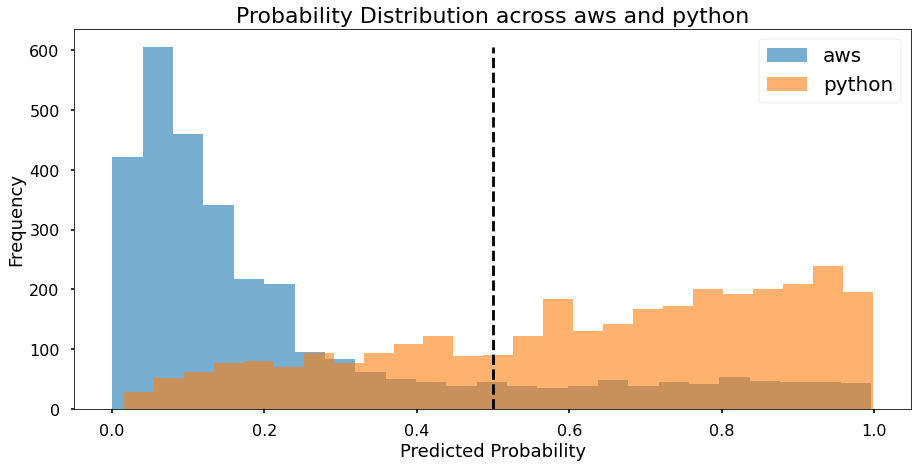

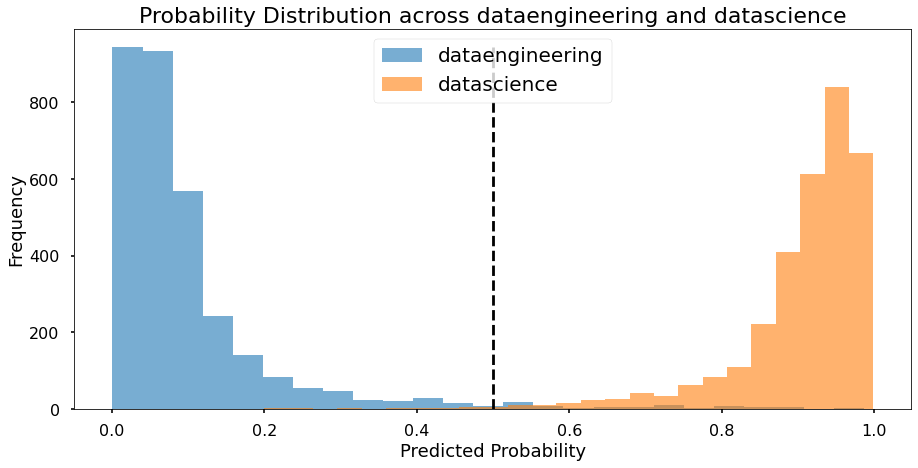

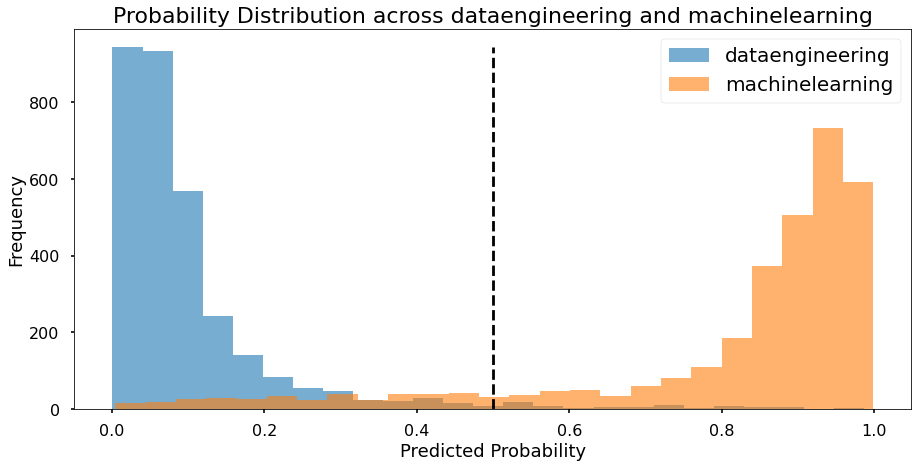

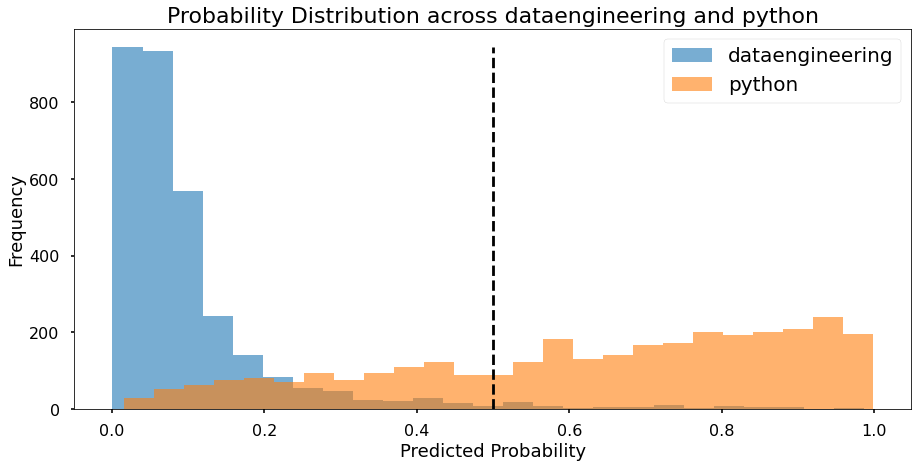

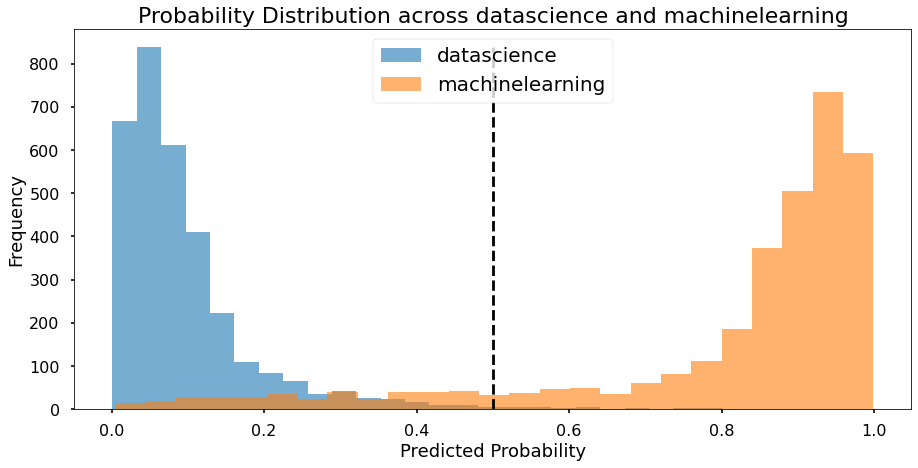

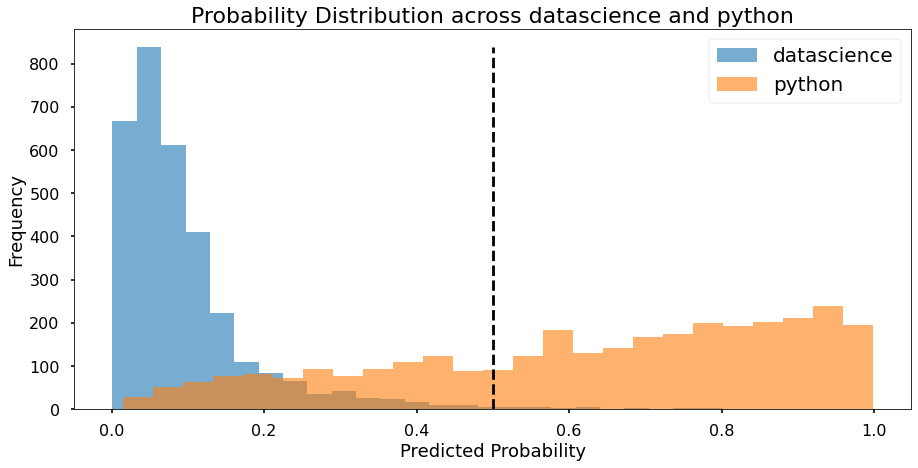

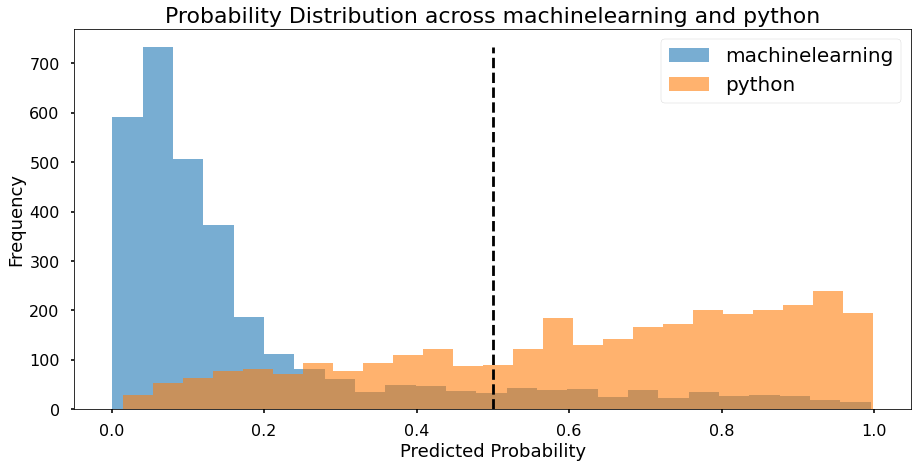

In [29]:
viz.plot_probability_distribution_pairs(y_probs=y_probs)